In [ ]:
import os
import sys
import json
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import dask.array as da
import zarr

# Import delay and parallel functions from joblib
from joblib import delayed, Parallel

from histomicstk.preprocessing.\
    color_conversion import rgb_to_lab, lab_mean_std, rgb_to_hsi
from histomicstk.saliency.tissue_detection import (
    get_slide_thumbnail, get_tissue_mask, threshold_multichannel)

OPENSLIDE_PATH = r"C:\Users\Motoc\AppData\Local\Programs\Python\openslide-bin-4.0.0.3-windows-x64\bin" # Change to the path where you extracted the OpenSlide binaries

import os
if hasattr(os, 'add_dll_directory'):
    # Windows
    with os.add_dll_directory(OPENSLIDE_PATH):
        import openslide
        import openslide.deepzoom
else:
    import openslide

vipsHome = r"D:\Maya\Work\Projects\Project_2_Fibrosis_Quantification_25_06_24\Utils\vips-dev-8.15\bin" # Change to the path where you extracted the VIPS binaries
os.environ['PATH'] = vipsHome + ';' + os.environ['PATH']
import pyvips

sys.path.append(r"E:\Maya\Work\Projects\Project_7_Custom_YOLO_Mari\utils") # Change to the path where you cloned the repository
import GenericTiffHandlerV3 as genTiff

In [9]:
def get_white_mask(img):
    # Create a mask with all white (background) pixels labeled as 1
    white_mask, _ = threshold_multichannel(rgb_to_hsi(img), {
        'hue': {'min': 0, 'max': 1.0},
        'saturation': {'min': 0, 'max': 0.2},
        'intensity': {'min': 220, 'max': 255},
    },just_threshold=True)

    return white_mask

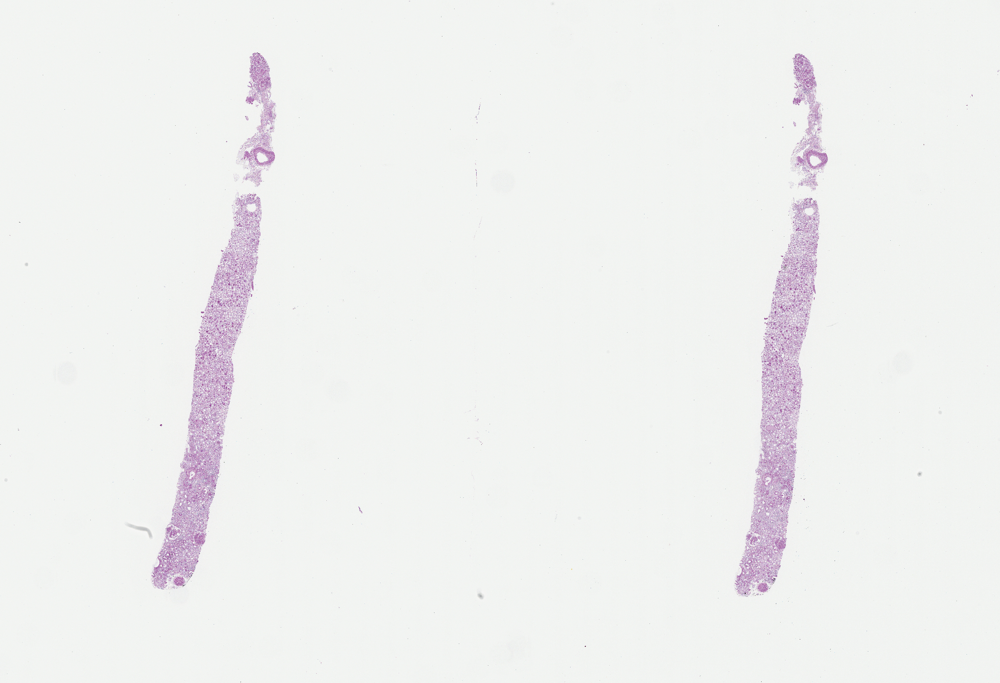

In [6]:
# Load the slide
slide_path = r"D:\Maya\Work\Projects\Auxiliary_1_Raw_Images\PAS\KPMP Dataset\0c00f3e1-9363-48b6-a742-00d49bd26a97_segmentation_masks\S-2006-005000_PAS_1of2.svs"
slide = genTiff.GenericTiffHandler(slide_path)

# Display a thumbnail for sanity check
display(slide.get_thumbnail(24))

In [ ]:
tissue_mask = None # Pass the tissue mask path here if you have one (I recommend)

if tissue_mask is not None:
    tissue_mask = genTiff.GenericTiffHandler(tissue_mask)

# Define the parameters for the patch extraction
tile_size = 1024
overlap = 0
tissue_percentage = 50

# Given these parameters, we can calculate the number of tiles in each dimension
tiles_y,tiles_x = slide.get_tile_dimensions(tile_size, tile_size, overlap)

# Using parallel processing, we can extract all the patches in parallel that contain tissue
def is_tile_valid(tissue_percentage,slide_path, tissue_mask, tile_size, overlap, col, row):
    
    if tissue_mask is not None:
        tissue_mask = genTiff.GenericTiffHandler(tissue_mask)
        tissue_tile = np.asarray(tissue_mask.get_tile(tile_size,tile_size,overlap,col,row))
        if np.max(tissue_tile) > 1:
            tissue_tile = tissue_tile/255
        if (np.sum(tissue_tile)/(tile_size*tile_size))*100 >= tissue_percentage:
            return col,row
        else:
            return None
    else:
        slide = genTiff.GenericTiffHandler(slide_path)
        tile = np.asarray(slide.get_tile(tile_size,tile_size,overlap,col,row))
        background_mask = get_white_mask(tile)
        tissue_mask = np.logical_not(background_mask)
        
        if (np.sum(tissue_mask)/(tile_size*tile_size))*100 >= tissue_percentage:
            return col,row
        else:
            return None

# If your computer is overworkded, you can reduce the number of jobs
list_of_tiles = Parallel(n_jobs=8)(
    delayed(is_tile_valid)(
        tissue_percentage,slide_path, tissue_mask, tile_size, overlap, col, row) for col in range(tiles_y) for row in range(tiles_x))
        
list_of_tiles = [tile for tile in list_of_tiles if tile is not None]

print(f"Number of tiles with tissue: {len(list_of_tiles)}")


Number of tiles with tissue: 127


In [36]:
print(list_of_tiles)

[(11, 38), (11, 39), (11, 40), (12, 35), (12, 36), (12, 37), (12, 38), (12, 39), (12, 40), (13, 29), (13, 30), (13, 31), (13, 32), (13, 33), (13, 34), (13, 35), (13, 36), (13, 37), (13, 38), (13, 39), (14, 22), (14, 23), (14, 24), (14, 25), (14, 26), (14, 27), (14, 28), (14, 29), (14, 30), (14, 31), (14, 32), (14, 33), (14, 34), (14, 35), (15, 19), (15, 20), (15, 21), (15, 22), (15, 23), (15, 24), (15, 25), (15, 26), (15, 27), (15, 28), (15, 29), (16, 17), (16, 18), (16, 19), (16, 20), (16, 21), (16, 22), (17, 10), (17, 14), (17, 15), (17, 16), (17, 17), (17, 18), (17, 19), (18, 4), (18, 5), (18, 6), (18, 8), (18, 9), (18, 10), (52, 38), (52, 39), (52, 40), (53, 30), (53, 31), (53, 32), (53, 33), (53, 34), (53, 35), (53, 36), (53, 37), (53, 38), (53, 39), (53, 40), (54, 20), (54, 21), (54, 22), (54, 23), (54, 24), (54, 25), (54, 26), (54, 27), (54, 28), (54, 29), (54, 30), (54, 31), (54, 32), (54, 33), (54, 34), (54, 35), (54, 36), (54, 37), (54, 38), (55, 18), (55, 19), (55, 20), (55,

In [ ]:
# Define the output path
output_path = r"E:\Maya\Work\Projects\DELETE"

def extract_tile(output_path,slide_path, tile_size, overlap, col, row):
    tile = genTiff.GenericTiffHandler(slide_path).get_tile(tile_size,tile_size,overlap,col,row)
    try:
        tile.save(output_path + f"\\{col}_{row}.png")
        return True
    except:
        return None

# Extract the tiles
# If your computer is overworkded, you can reduce the number of jobs
saving = Parallel(n_jobs=8)(
    delayed(extract_tile)(
        output_path,slide_path, tile_size, overlap, col, row) for col,row in list_of_tiles)

saving = [save for save in saving if save is not None]

print(f"Number of tiles saved: {len(saving)}")

    